# DALL·E Mini

This is an simple way of creating [DALL·E Mini](https://github.com/borisdayma/dalle-mini) artworks for generative artists.

```{note}
Install ekorpkit package first.

Set logging level to Warning, if you don't want to see verbose logging.

If you run this notebook in Colab, set Hardware accelerator to GPU.


Check your jaxlib version and install the appropriate version. for example,

pip install "jax[cuda11_cudnn82]" -f https://storage.googleapis.com/jax-releases/jax_cuda_releases.html
```

```{toggle}
%%capture
!pip install ekorpkit[art]
exit()
```

In [1]:
from ekorpkit import eKonf

eKonf.setLogger("INFO")
eKonf.set_cuda(device="4,5")
print("version:", eKonf.__version__)

is_notebook = eKonf.is_notebook()
is_colab = eKonf.is_colab()
print("is notebook?", is_notebook)
print("is colab?", is_colab)
if is_colab:
    eKonf.mount_google_drive(
        workspace="MyDrive/colab_workspace", project="disco-imagen"
    )

print("environment variables:")
eKonf.print(eKonf.env().dict())

INFO:ekorpkit.base:Setting cuda device to ['A100-SXM4-40GB', 'A100-SXM4-40GB']
INFO:ekorpkit.base:Google Colab not detected.


version: 0.1.36+4.gafa5b2d.dirty
is notebook? True
is colab? False
evironment varialbles:
{'CUDA_DEVICE_ORDER': 'PCI_BUS_ID',
 'CUDA_VISIBLE_DEVICES': '4, 5',
 'EKORPKIT_CONFIG_DIR': '/workspace/projects/ekorpkit-book/config',
 'EKORPKIT_DATA_DIR': None,
 'EKORPKIT_LOG_LEVEL': 'INFO',
 'EKORPKIT_PROJECT': 'ekorpkit-book',
 'EKORPKIT_WORKSPACE_ROOT': '/workspace',
 'KMP_DUPLICATE_LIB_OK': 'TRUE',
 'NUM_WORKERS': 230}


In [2]:
cfg = eKonf.compose("model/dalle_mini")
dalle = eKonf.instantiate(cfg)

INFO:ekorpkit.base:Loaded .env from /workspace/projects/ekorpkit-book/config/.env
INFO:ekorpkit.base:setting environment variable CACHED_PATH_CACHE_ROOT to /workspace/.cache/cached_path
INFO:ekorpkit.base:setting environment variable KMP_DUPLICATE_LIB_OK to TRUE
INFO:ekorpkit.base:Google Colab not detected.
INFO:ekorpkit.models.art.base:> downloading models...
INFO:ekorpkit.models.art.base:> loading modules...
INFO:ekorpkit.utils.lib:dalle_mini not imported, loading from /workspace/projects/ekorpkit-book/disco-imagen/libs/dalle-mini/src/dalle_mini as dalle_mini
INFO:ekorpkit.utils.lib:vqgan_jax.modeling_flax_vqgan not imported, loading from /workspace/projects/ekorpkit-book/disco-imagen/libs/vqgan-jax as vqgan_jax.modeling_flax_vqgan
INFO:ekorpkit.models.art.base:> loading models...
INFO:absl:Unable to initialize backend 'tpu_driver': NOT_FOUND: Unable to find driver in registry given worker: 
INFO:absl:Unable to initialize backend 'rocm': NOT_FOUND: Could not find registered platform 

In [3]:
# text_prompts = 'At a special meeting, dovish central bankers are poised to cut the target rates. Trending on artstation, matte style'
# text_prompts = "Dovish members of the Federal Reserve Board are to cut the target interest rates. matte style, artstation"
# batch_name = "dovish"

# text_prompts = 'At a special meeting, hawkish central bankers are poised to raise the target rates. Trending on artstation, matte style'
# batch_name = "hawkish"

# text_prompts = "Mt. Halla's beautiful flowers, artstation, matte"
# batch_name = "halla"

text_prompts = "Brave new world"
batch_name = "newworld"



INFO:ekorpkit.models.art.mini: >> elapsed time to diffuse: 0:00:34.757086
INFO:ekorpkit.models.art.base:Merging config with args: {}
INFO:ekorpkit.models.art.base:Prompt: Brave new world


6 samples generated to /workspace/projects/ekorpkit-book/disco-imagen/outputs/dalle-mini/newworld
text prompts: ['Brave new world']
sample image paths:
/workspace/projects/ekorpkit-book/disco-imagen/outputs/dalle-mini/newworld/newworld(0)_0000.png
/workspace/projects/ekorpkit-book/disco-imagen/outputs/dalle-mini/newworld/newworld(0)_0001.png
/workspace/projects/ekorpkit-book/disco-imagen/outputs/dalle-mini/newworld/newworld(0)_0002.png
/workspace/projects/ekorpkit-book/disco-imagen/outputs/dalle-mini/newworld/newworld(0)_0003.png
/workspace/projects/ekorpkit-book/disco-imagen/outputs/dalle-mini/newworld/newworld(0)_0004.png
/workspace/projects/ekorpkit-book/disco-imagen/outputs/dalle-mini/newworld/newworld(0)_0005.png


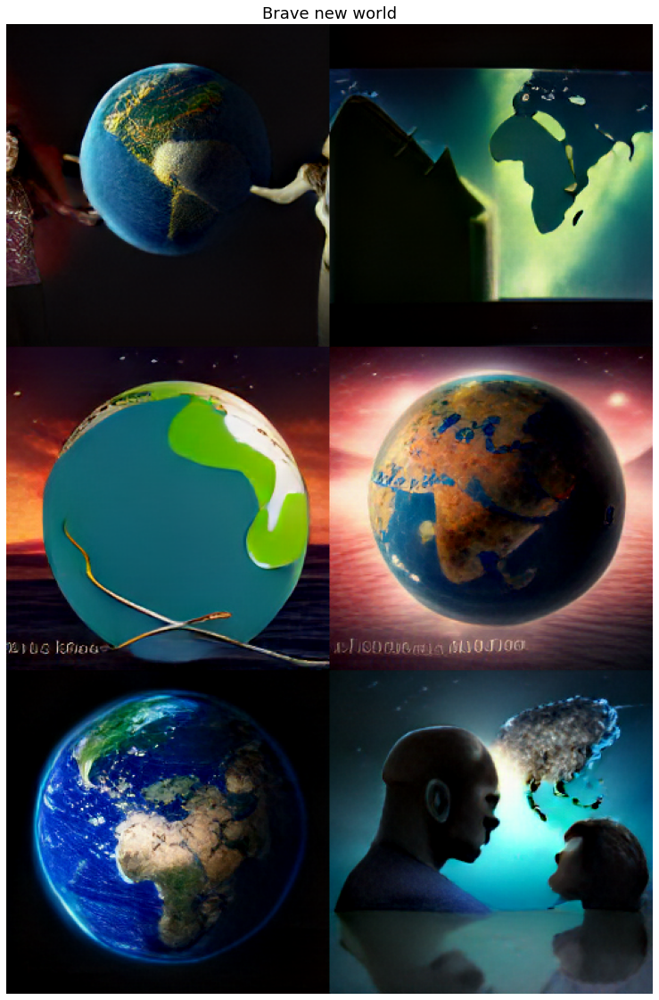

In [4]:
dalle.imagine(
    text_prompts, 
    batch_name=batch_name, 
    n_samples=6, 
    show_collage=True,
)

## collage generated sample images

INFO:ekorpkit.models.dalle.base:Loading config from /workspace/projects/ekorpkit-book/disco-imagen/outputs/dalle-mini/halla/halla(5)_settings.yaml
INFO:ekorpkit.models.dalle.base:Merging config with diffuse defaults
INFO:ekorpkit.models.dalle.base:Prompt: Mt. Halla's beautiful flowers, artstation, matte
INFO:ekorpkit.io.file:Processing [6] files from ['halla(5)_*.png']


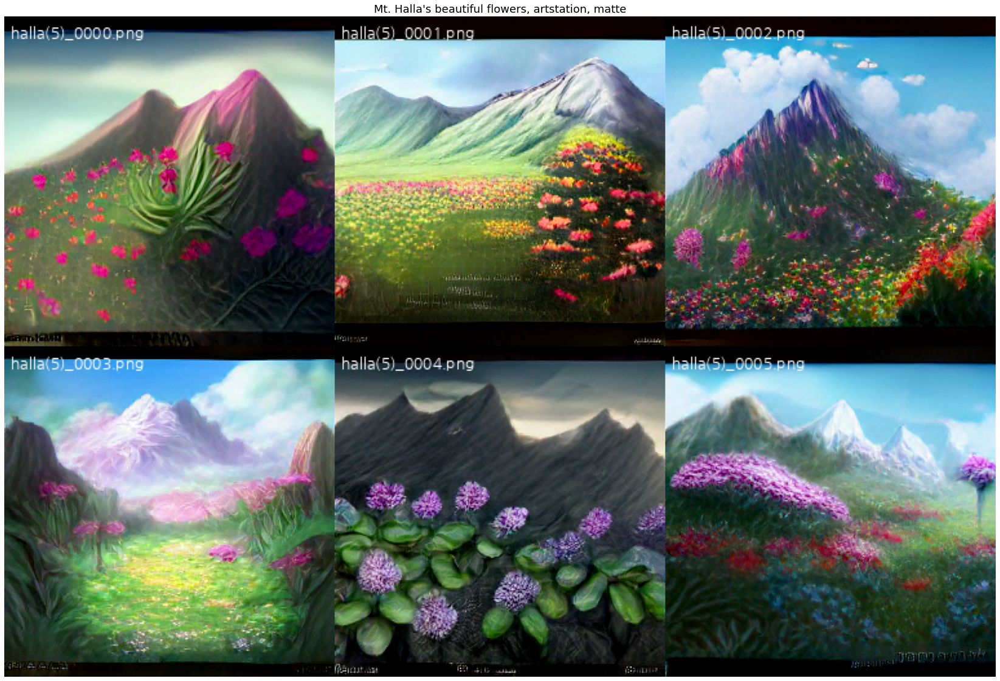

In [6]:
dalle.collage(
    batch_name=batch_name,
    batch_num=5,
    ncols=3,
    num_images=6,
    show_filename=True,
    fontcolor="white",
)

### show config

In [7]:
dalle.show_config(batch_name=batch_name, batch_num=0)

INFO:ekorpkit.models.dalle.base:Loading config from /workspace/projects/ekorpkit-book/disco-imagen/outputs/dalle-mini/halla/halla(0)_settings.yaml
INFO:ekorpkit.models.dalle.base:Merging config with diffuse defaults


{'batch_name': 'halla',
 'batch_num': 8,
 'cond_scale': 10.0,
 'gen_top_k': None,
 'gen_top_p': None,
 'n_samples': 6,
 'num_samples': 6,
 'resume_run': False,
 'run_to_resume': 'latest',
 'seed': 2301282676,
 'set_seed': 'random_seed',
 'show_collage': True,
 'temperature': None,
 'text_prompts': ["Mt. Halla's beautiful flowers, photorealistic"]}
